# Churn:
A problem for B2C companies, churn is when a customer stop buying all products and
services and becomes an ex-customer. Typically, this is a negative event for the company as it
reduces the businesses revenue.
# Churn prediction: 
Churn prediction is one of the most popular Big Data use cases in business. It
consists of detecting customers who are likely to cancel a subscription to a service.
# Customer Churn: 
Customer churn is when a customer stop buying all products and services and
becomes an ex-customer. Typically, this is a negative event for the company as it reduces the
businesses revenue. Importantly this is done on a cohort basis, i.e., new customers added in the
period are ignored in the calculation.
# Why Customer Churn Prediction Is Important
Customer churn prediction allows organizations to proactively approach at-risk clients and try
to repair the relationship before the customer leaves. In effect it is a pre-warning that lets you
act.
It is generally accepted that retaining a customer costs a lot less than acquiring a new one. So
being able to predict a customer is going to churn and preventing it, is better than losing them
and finding another to replace them.
# Objectives:
### Finding the most suited machine learning model for correct classification of Churn and non churn customers.

## SETTING UP THE ENVIRONMENT

## Data Preprocessing and EDA Liberaries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas_profiling.profile_report as report
%matplotlib inline
import seaborn as sns
import plotly
import plotly.graph_objs as go
import plotly.express as px
import plotly.graph_objects as go
from plotly import offline
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')
import pickle

## Model Building Liberaries

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import recall_score, confusion_matrix, precision_score, f1_score, accuracy_score, classification_report

from sklearn.ensemble import VotingClassifier
from sklearn.metrics import confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import KFold
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn.metrics import classification_report, precision_recall_curve
from sklearn.metrics import auc, roc_auc_score, roc_curve
from sklearn.metrics import make_scorer, recall_score, log_loss
from sklearn.metrics import average_precision_score
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve

## Model Explainability Liberaries

In [3]:
import xgboost
import shap
from lime.lime_tabular import LimeTabularExplainer
import eli5
from eli5.sklearn import PermutationImportance
from matplotlib.pyplot import figure
%matplotlib inline
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots


## Loading the Dataset

In [4]:
df = pd.read_csv("../input/telecom-customer-churn-by-maven-analytics/telecom_customer_churn.csv")

# Data Preprocessing

## Using pandas_profiling to have a holistic view of the dataset 
### Generates profile reports from a pandas DataFrame.

## The pandas df.describe() function is great but a little basic for serious exploratory data analysis. pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.

In [5]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Manipulating column names for ease in calling them throughout the project

In [6]:
df.columns=df.columns.str.replace(" ","").str.lower()

### Dealing with Nulls 
#### since this dataset is from a telecommunication company and this company has basically two main serivces that are 
1- Phone Service </br> 
2- Internet Service
#### So it isnt necesary that every customer is availing both of the services, and this caused presence of nulls in the dataset
#### So I have replaced nulls for the features that are related to phone service as "No phone service" for the customer that are just #### using internet services and simlarly for the features that give info related to internet services have been replaced by "No internet #### Service" for the customers that are just using phone services

In [7]:
df.avgmonthlylongdistancecharges=df.avgmonthlylongdistancecharges.fillna(0.0)

In [8]:
df.multiplelines=df.multiplelines.fillna('no phone service')

In [9]:
no_internet=['internettype','onlinesecurity','onlinebackup','deviceprotectionplan','premiumtechsupport','streamingtv',
             'streamingmovies','streamingmusic','unlimiteddata']
df[no_internet]=df[no_internet].fillna('no internet service')

In [10]:
df.avgmonthlygbdownload=df.avgmonthlygbdownload.fillna(0)

### Droping features that are of no importance for the my objective, I have dropped geographical features after finding no correlation with other features, and also the columns like churn category and churn reason are out of the scope of machine learning model, they can be useful in exploratory analysis but EDA is not the focus of this notebook.

In [11]:
df=df.drop(columns=['customerid','churncategory','churnreason','totalrefunds','zipcode','longitude','latitude','city'])

In [12]:
df.shape

(7043, 30)

In [13]:
df.isnull().sum()

gender                           0
age                              0
married                          0
numberofdependents               0
numberofreferrals                0
tenureinmonths                   0
offer                            0
phoneservice                     0
avgmonthlylongdistancecharges    0
multiplelines                    0
internetservice                  0
internettype                     0
avgmonthlygbdownload             0
onlinesecurity                   0
onlinebackup                     0
deviceprotectionplan             0
premiumtechsupport               0
streamingtv                      0
streamingmovies                  0
streamingmusic                   0
unlimiteddata                    0
contract                         0
paperlessbilling                 0
paymentmethod                    0
monthlycharge                    0
totalcharges                     0
totalextradatacharges            0
totallongdistancecharges         0
totalrevenue        

### To avoid the biasness in the predictions i have dropped the customers information that joined the company recently

In [14]:
df=df.loc[~df.customerstatus.str.contains('Join')]
df.reset_index(drop=True,inplace=True)

# Exploratory Analysis
### Main focus of this notebook is on machine learning for detailed exploratory analysis you can visit below mentioned kaggle notebooks
https://www.kaggle.com/code/shilongzhuang/the-customers-that-matter </br>
https://www.kaggle.com/code/shilongzhuang/why-customers-churn-telecom-industry

In [15]:
type_ = ["No", "yes"]
fig = make_subplots(rows=1, cols=1)

fig.add_trace(go.Pie(labels=type_, values=df['customerstatus'].value_counts(), name="customerstatus"))

# Use `hole` to create a donut-like pie chart
fig.update_traces(hole=.4, hoverinfo="label+percent+name", textfont_size=16)

fig.update_layout(
    title_text="Churn Distributions",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Churn', x=0.5, y=0.5, font_size=20, showarrow=False)])
fig.show()

In [16]:
df.customerstatus[df.customerstatus == 'Stayed'].groupby(by = df.gender).count()

gender
Female    2338
Male      2382
Name: customerstatus, dtype: int64

In [17]:
df.customerstatus[df.customerstatus == 'Churned'].groupby(by = df.gender).count()

gender
Female    939
Male      930
Name: customerstatus, dtype: int64

In [18]:
fig = px.histogram(df, x="customerstatus", color = "contract", barmode = "group", title = "<b>Customer contract distribution<b>")
fig.update_layout(width=700, height=500, bargap=0.2)
fig.show()

## Feature Transformation and Feature Scaling
#### 1- Features having two uniques were replaced by 1 and 0.
#### 2- Features having more than two uniques were encoded using label encoder
#### 3- Continous features were standarized using sk-learn scaler method

In [19]:
#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique 

le_count = 0
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

5 columns were label encoded.


In [20]:
df['gender'] = [1 if each == 'Female' else 0 for each in df['gender']]

In [21]:
df.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,None,1,42.39,No,...,Yes,One Year,1,Credit Card,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,None,1,10.69,Yes,...,No,Month-to-Month,0,Credit Card,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,Offer E,1,33.65,No,...,Yes,Month-to-Month,1,Bank Withdrawal,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,Offer D,1,27.82,No,...,Yes,Month-to-Month,1,Bank Withdrawal,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,None,1,7.38,No,...,Yes,Month-to-Month,1,Credit Card,83.9,267.40,0,22.14,289.54,0


In [22]:
def encode_data(dataframe):
    if dataframe.dtype == "object":
        dataframe = LabelEncoder().fit_transform(dataframe)
    return dataframe

data = df.apply(lambda x: encode_data(x))
data.head()

,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,0,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


In [23]:
data.to_csv('mycsvfile.csv',index=False)

### Splitting the Dataset into test and train

In [24]:
X = data.drop(columns = "customerstatus")
y = data["customerstatus"].values

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 4, stratify =y)

In [26]:
col=['totalcharges','avgmonthlylongdistancecharges','monthlycharge','totalrevenue','totallongdistancecharges',
     'tenureinmonths','totallongdistancecharges','totalextradatacharges']

In [27]:
scaler = StandardScaler()
X_train[col] = StandardScaler().fit_transform(X_train[col])
X_test[col] = StandardScaler().fit_transform(X_test[col])

# Model Building Without Optimization 
#### Since its a binary Classification Problem. So I have tried to build several classification models
#### At first i have just used the base models and have evaluated them to check how they are pwrforming

In [28]:
models = []
models.append(('Logistic Regression', LogisticRegression()))
models.append(('Kernel SVM', SVC()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('Gaussian NB', GaussianNB()))
models.append(('Random Forest', RandomForestClassifier()))
models.append(('Decision Tree Classifier', DecisionTreeClassifier()))

In [29]:
acc_results =[]
auc_results =[]
pre_results =[]
f1_results =[]
names = []

result_col = ["Algorithm", "ROC AUC", "Accuracy", "Precision", "f1 Score"]
model_results = pd.DataFrame(columns = result_col)

i=0
# K- fold cross validation

for name, model in models:
    names.append(name)
    # kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results = model_selection.cross_val_score(model, X_train, y_train, 
                     scoring="accuracy")
    cv_auc_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="roc_auc")
    cv_pre_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="precision")
    cv_f1_results = model_selection.cross_val_score(model, X_train, y_train,
                     scoring="f1")
    acc_results.append(cv_acc_results)
    auc_results.append(cv_auc_results)
    pre_results.append(cv_pre_results)
    f1_results.append(cv_f1_results)
    
    model_results.loc[i] = [name, 
                           round(cv_acc_results.mean()*100,2),
                           round(cv_auc_results.mean()*100,2),
                           round(cv_pre_results.mean()*100,2),
                           round(cv_f1_results.mean()*100,2)]
    i+=1

model_results.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,f1 Score
4,Random Forest,86.69,91.99,88.46,90.93
0,Logistic Regression,83.96,90.67,89.02,88.76
5,Decision Tree Classifier,81.03,77.55,87.28,87.23
1,Kernel SVM,79.27,86.18,80.52,86.63
3,Gaussian NB,76.87,86.19,91.32,82.23
2,KNN,75.43,78.87,82.60,82.90


# **Finding Good Hyper Parameters on above models indiviually**

## Decision Tree Classifier

In [30]:
modelD= DecisionTreeClassifier()

In [31]:
 modelD.fit(X_train, y_train) 

DecisionTreeClassifier()

In [32]:
pred_train_D = modelD.predict(X_train)
pred_test_D=modelD.predict(X_test)

In [33]:
acc_train_D = accuracy_score(pred_train_D, y_train)
acc_test_D = accuracy_score(pred_test_D, y_test)
print(f'Training accuracy {acc_train_D: .3f}') 
print(f'Testing accuracy {acc_test_D: .3f}')

Training accuracy  1.000
Testing accuracy  0.837


### Tuning The Parameters

In [34]:
tuned_parameters = [{'criterion':['gini', 'entropy'],
                     'max_leaf_nodes': range(5,25)}] # hyperparameters to tune

clf_D = GridSearchCV(DecisionTreeClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clf_D.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clf_D.best_params_) # best hyperparameter balues

print("\nGrid scores:")
means_D = clf_D.cv_results_['mean_test_score'] # mean accuracy with folds
stds_D = clf_D.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(means_D, stds_D, clf_D.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best parameters found:
{'criterion': 'gini', 'max_leaf_nodes': 19}

Grid scores:
0.844 (+/-0.022) for {'criterion': 'gini', 'max_leaf_nodes': 5}
0.851 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 6}
0.853 (+/-0.010) for {'criterion': 'gini', 'max_leaf_nodes': 7}
0.857 (+/-0.009) for {'criterion': 'gini', 'max_leaf_nodes': 8}
0.857 (+/-0.009) for {'criterion': 'gini', 'max_leaf_nodes': 9}
0.856 (+/-0.010) for {'criterion': 'gini', 'max_leaf_nodes': 10}
0.856 (+/-0.011) for {'criterion': 'gini', 'max_leaf_nodes': 11}
0.856 (+/-0.011) for {'criterion': 'gini', 'max_leaf_nodes': 12}
0.856 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 13}
0.858 (+/-0.014) for {'criterion': 'gini', 'max_leaf_nodes': 14}
0.859 (+/-0.015) for {'criterion': 'gini', 'max_leaf_nodes': 15}
0.860 (+/-0.020) for {'criterion': 'gini', 'max_leaf_nodes': 16}
0.859 (+/-0.019) for {'criterion': 'gini', 'max_leaf_nodes': 17}
0.859 (+/-0.017)

#### Evaluating Decision Tree classifier with selected hyper-parameters

Based on our 5-fold-cross-validation, we use a model with the following hyper-parameters:

- *criterion* = '*gini*'
- *max_leaf_nodes* = 19

DecisionTreeClassifier(max_leaf_nodes=19)
Results on test data
Test accuracy =  0.8553
Test precision =  0.8655
Test recall =  0.9449
Classification report:
              precision    recall  f1-score   support

           0       0.82      0.63      0.71       561
           1       0.87      0.94      0.90      1416

    accuracy                           0.86      1977
   macro avg       0.84      0.79      0.81      1977
weighted avg       0.85      0.86      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  353   208
1   78  1338

ROC curve


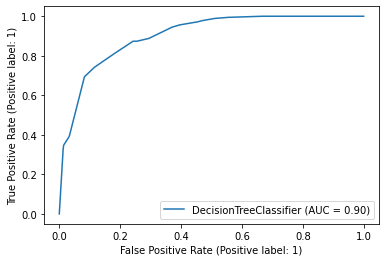

In [35]:
criterion = 'gini'
max_leaf_nodes = 19
# Train and test model
good_model_D = DecisionTreeClassifier(criterion=criterion,
                                    max_leaf_nodes=max_leaf_nodes) # create model 
print(good_model_D) # display model parameters
good_model_D.fit(X_train, y_train) # train model
pred_D = good_model_D.predict(X_test) # predicted output for test examples
print("Results on test data")
acc_D = accuracy_score(y_test, pred_D) # accuracy on test examples
prec_D = precision_score(y_test, pred_D) # precision on test examples
reca_D = recall_score(y_test, pred_D) # recall on test examples
print(f'Test accuracy = {acc_D: .4f}') # round to 4 decimal places
print(f'Test precision = {prec_D: .4f}') # round to 4 decimal places
print(f'Test recall = {reca_D: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred_D))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred_D)))
print('\nROC curve')
plot_roc_curve(good_model_D, X_test, y_test)  # 
plt.show()

## Random Forest model

In [36]:
modelR = RandomForestClassifier()

In [37]:
 modelR.fit(X_train, y_train) 

RandomForestClassifier()

In [38]:
pred_train = modelR.predict(X_train)
pred_test=modelR.predict(X_test)

In [39]:
acc_train = accuracy_score(pred_train, y_train)
acc_test = accuracy_score(pred_test, y_test)
print(f'Training accuracy {acc_train: .3f}') 
print(f'Testing accuracy {acc_test: .3f}')

Training accuracy  1.000
Testing accuracy  0.869


#### Tuning the Parameters

In [40]:
tuned_parameters = [{'n_estimators': [25, 50, 75],
                     'max_features': [15, 20, 25],
                     'max_leaf_nodes': [8, 16, 24]}] # hyperparameters to tune

clfR = GridSearchCV(RandomForestClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfR.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfR.best_params_) # best hyperparameter values

print("\nGrid scores:")
means = clfR.cv_results_['mean_test_score'] # mean accuracy with folds
stds = clfR.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(means, stds, clfR.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 27 candidates, totalling 135 fits

Best parameters found:
{'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 50}

Grid scores:
0.865 (+/-0.011) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 25}
0.867 (+/-0.013) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 50}
0.867 (+/-0.013) for {'max_features': 15, 'max_leaf_nodes': 8, 'n_estimators': 75}
0.870 (+/-0.007) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 25}
0.868 (+/-0.011) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 50}
0.871 (+/-0.012) for {'max_features': 15, 'max_leaf_nodes': 16, 'n_estimators': 75}
0.868 (+/-0.008) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 25}
0.871 (+/-0.008) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 50}
0.869 (+/-0.014) for {'max_features': 15, 'max_leaf_nodes': 24, 'n_estimators': 75}
0.867 (+/-0.017) for {'max_features': 20, 'max_leaf_nodes': 8, 'n_estimators': 25}
0

#### 5\. Evaluating Random forest classifier with selected hyper-parameters

Based on our 5-fold-cross-validation, we use a model with the following hyper-parameters:

- *max_features* = '*15*'
- *max_leaf_nodes* = 16
- *n-estimators* = 50

RandomForestClassifier(max_features=15, max_leaf_nodes=16, n_estimators=50)
Results on test data
Test accuracy =  0.8589
Test precision =  0.8675
Test recall =  0.9477
Classification report:
              precision    recall  f1-score   support

           0       0.83      0.63      0.72       561
           1       0.87      0.95      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.85      0.79      0.81      1977
weighted avg       0.86      0.86      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  356   205
1   74  1342

ROC curve


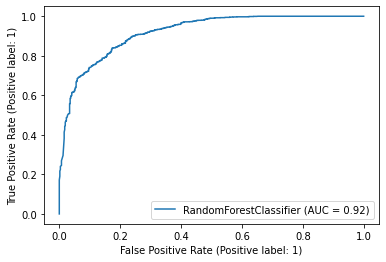

In [41]:
# Specify non-default hyper-parameter values
max_features = 15
max_leaf_nodes = 16 
n_estimators = 50
# Train and test model
good_model = RandomForestClassifier(max_leaf_nodes = max_leaf_nodes,
                                    max_features = max_features, 
                                    n_estimators=n_estimators, ) # create model 
print(good_model) # display model parameters
good_model.fit(X_train, y_train) # train model
pred = good_model.predict(X_test) # predicted output for test examples
print("Results on test data")
acc = accuracy_score(y_test, pred) # accuracy on test examples
prec = precision_score(y_test, pred) # precision on test examples
reca = recall_score(y_test, pred) # recall on test examples
print(f'Test accuracy = {acc: .4f}') # round to 4 decimal places
print(f'Test precision = {prec: .4f}') # round to 4 decimal places
print(f'Test recall = {reca: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred)))
print('\nROC curve')
plot_roc_curve(good_model, X_test, y_test)  # 
plt.show()

## Logistic Regression

In [42]:
modelL=LogisticRegression()

In [43]:
modelL.fit(X_train,y_train)

LogisticRegression()

In [44]:
pred_trainL = modelL.predict(X_train)
pred_testL=modelL.predict(X_test)

In [45]:
acc_trainL = accuracy_score(pred_trainL, y_train)
acc_testL = accuracy_score(pred_testL, y_test)
print(f'Training accuracy {acc_trainL: .3f}') 
print(f'Testing accuracy {acc_testL: .3f}')

Training accuracy  0.847
Testing accuracy  0.857


### Tuning the parameters

In [46]:
tuned_parameters = [{'C': [10.0, 100.0, 1000.0, 10000.0],
                     'max_iter': [500, 1000]}] # hyperparameters to tune


clfL = GridSearchCV(LogisticRegression(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfL.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfL.best_params_) # best hyperparameter values

print("\nGrid scores:")
meansL = clfL.cv_results_['mean_test_score'] # mean accuracy with folds
stdsL = clfL.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansL, stdsL, clfL.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 8 candidates, totalling 40 fits

Best parameters found:
{'C': 100.0, 'max_iter': 500}

Grid scores:
0.843 (+/-0.030) for {'C': 10.0, 'max_iter': 500}
0.843 (+/-0.031) for {'C': 10.0, 'max_iter': 1000}
0.844 (+/-0.028) for {'C': 100.0, 'max_iter': 500}
0.843 (+/-0.032) for {'C': 100.0, 'max_iter': 1000}
0.844 (+/-0.030) for {'C': 1000.0, 'max_iter': 500}
0.843 (+/-0.032) for {'C': 1000.0, 'max_iter': 1000}
0.844 (+/-0.028) for {'C': 10000.0, 'max_iter': 500}
0.843 (+/-0.030) for {'C': 10000.0, 'max_iter': 1000}


### Evaluating on the basis of Best found parameters

LogisticRegression(C=1000, max_iter=1000)
Results on test data
Test accuracy =  0.8543
Test precision =  0.8989
Test recall =  0.8976
Classification report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  418   143
1  145  1271

ROC curve


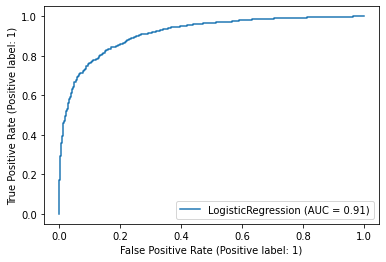

In [47]:
# Specify non-default hyper-parameter values
C = 1000
max_iter = 1000
# Train and test model
good_modelL = LogisticRegression(C = C, max_iter=max_iter) # create model 
print(good_modelL) # display model parameters
good_modelL.fit(X_train,y_train) # train model
predL = good_modelL.predict(X_test) # predicted output for test examples
print("Results on test data")
accL = accuracy_score(y_test, predL) # accuracy on test examples
precL = precision_score(y_test, predL) # precision on test examples
recaL = recall_score(y_test, predL) # recall on test examples
print(f'Test accuracy = {accL: .4f}') # round to 4 decimal places
print(f'Test precision = {precL: .4f}') # round to 4 decimal places
print(f'Test recall = {recaL: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predL))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predL)))
print('\nROC curve')
plot_roc_curve(good_modelL, X_test, y_test)  # 
plt.show()

### KNN MODEL

In [48]:
modelknn= KNeighborsClassifier().fit(X_train,y_train)

In [49]:
pred_trainknn = modelknn.predict(X_train)
pred_testknn=modelknn.predict(X_test)

In [50]:
acc_trainknn = accuracy_score(pred_trainknn, y_train)
acc_testknn = accuracy_score(pred_testknn, y_test)
print(f'Training accuracy {acc_trainknn: .3f}') 
print(f'Testing accuracy {acc_testknn: .3f}')

Training accuracy  0.843
Testing accuracy  0.788


In [51]:
tuned_parameters = [{'algorithm':['brute'],
                     'metric': ['euclidean', 'minkowski'],
                    'n_neighbors': [5, 10, 20]}] # hyperparameters to tune

clfknn = GridSearchCV(KNeighborsClassifier(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfknn.fit(X_train, y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfknn.best_params_) # best hyperparameter balues

print("\nGrid scores:")
meansknn = clfknn.cv_results_['mean_test_score'] # mean accuracy with folds
stdsknn = clfknn.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansknn, stdsknn, clfknn.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 6 candidates, totalling 30 fits

Best parameters found:
{'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 10}

Grid scores:
0.754 (+/-0.037) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 5}
0.768 (+/-0.039) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 10}
0.768 (+/-0.032) for {'algorithm': 'brute', 'metric': 'euclidean', 'n_neighbors': 20}
0.754 (+/-0.037) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 5}
0.768 (+/-0.039) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 10}
0.768 (+/-0.032) for {'algorithm': 'brute', 'metric': 'minkowski', 'n_neighbors': 20}


### Evaluating on best Found Parameters

KNeighborsClassifier(algorithm='brute', metric='euclidean', n_neighbors=20)
Results on test data
Test accuracy =  0.7820
Test precision =  0.8385
Test recall =  0.8616
Classification report:
              precision    recall  f1-score   support

           0       0.62      0.58      0.60       561
           1       0.84      0.86      0.85      1416

    accuracy                           0.78      1977
   macro avg       0.73      0.72      0.73      1977
weighted avg       0.78      0.78      0.78      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  326   235
1  196  1220

ROC curve


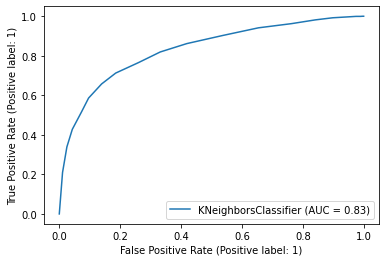

In [52]:
# Specify non-default hyper-parameter values
algorithm = 'brute'
metric = 'euclidean'
n_neighbors =  20
# Train and test model
good_modelknn = KNeighborsClassifier(algorithm=algorithm, metric=metric, 
                                  n_neighbors=n_neighbors) # create model 
print(good_modelknn) # display model parameters
good_modelknn.fit(X_train, y_train) # train model
predknn = good_modelknn.predict(X_test) # predicted output for test examples
print("Results on test data")
accknn = accuracy_score(y_test, predknn) # accuracy on test examples
precknn = precision_score(y_test, predknn) # precision on test examples
recaknn = recall_score(y_test, predknn) # recall on test examples
print(f'Test accuracy = {accknn: .4f}') # round to 4 decimal places
print(f'Test precision = {precknn: .4f}') # round to 4 decimal places
print(f'Test recall = {recaknn: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predknn))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predknn)))
print('\nROC curve')
plot_roc_curve(good_modelknn, X_test, y_test)  # 
plt.show()

## Super Vector Machines

In [53]:
modelsvm=svm.SVC().fit(X_train,y_train)

In [54]:
pred_trainsvm = modelsvm.predict(X_train)
pred_testsvm=modelsvm.predict(X_test)

In [55]:
acc_trainsvm = accuracy_score(pred_trainsvm, y_train)
acc_testsvm = accuracy_score(pred_testsvm, y_test)
print(f'Training accuracy {acc_trainsvm: .3f}') 
print(f'Testing accuracy {acc_testsvm: .3f}')

Training accuracy  0.807
Testing accuracy  0.803


## Tuning The Hyper Parameters

In [56]:
tuned_parameters = [{'kernel':['linear'], 'gamma':[1], 'C':[1]}]
                     # hyperparameters to tune

clfsvm = GridSearchCV(svm.SVC(), tuned_parameters, 
                   verbose=1, n_jobs=-1) # grid search model
clfsvm.fit(X_train,y_train) # evaluate hyper-parameters

print("\nBest parameters found:")
print(clfsvm.best_params_) # best hyperparameter balues

print("\nGrid scores:")
meansvm = clfsvm.cv_results_['mean_test_score'] # mean accuracy with folds
stdsvm = clfsvm.cv_results_['std_test_score'] # standard deviation of accuracies
# for each hyperparameter combination show mean +/- 2 standard-deviations 
for mean, std, params in zip(meansvm, stdsvm, clfsvm.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" %(mean, std * 2, params)) 

Fitting 5 folds for each of 1 candidates, totalling 5 fits

Best parameters found:
{'C': 1, 'gamma': 1, 'kernel': 'linear'}

Grid scores:
0.843 (+/-0.026) for {'C': 1, 'gamma': 1, 'kernel': 'linear'}


### Evaluating on the basis of best Parameters

SVC(C=1, gamma=0.1, kernel='linear')
Results on test data
Test accuracy =  0.8523
Test precision =  0.9003
Test recall =  0.8927
Classification report:
              precision    recall  f1-score   support

           0       0.73      0.75      0.74       561
           1       0.90      0.89      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  421   140
1  152  1264

ROC curve


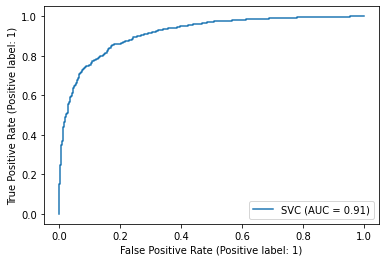

In [57]:
# Specify non-default hyper-parameter values
C = 1 # algorithm name
kernel = 'linear'# kernel type
gamma =  0.1 # kernel parameter
# Train and test model
good_modelsvm = svm.SVC(C=C, kernel=kernel, 
                                  gamma=gamma) # create model 
print(good_modelsvm) # display model parameters
good_modelsvm.fit(X_train,y_train) # train model
predsvm = good_modelsvm.predict(X_test) # predicted output for test examples
print("Results on test data")
accsvm = accuracy_score(y_test, predsvm) # accuracy on test examples
precsvm = precision_score(y_test, predsvm) # precision on test examples
recasvm = recall_score(y_test, predsvm) # recall on test examples
print(f'Test accuracy = {accsvm: .4f}') # round to 4 decimal places
print(f'Test precision = {precsvm: .4f}') # round to 4 decimal places
print(f'Test recall = {recasvm: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predsvm))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predsvm)))
print('\nROC curve')
plot_roc_curve(good_modelsvm, X_test, y_test)  # 
plt.show()

### **GETTING COMBINED RESULTS FROM THE TUNED MODELS** 

In [58]:
models_opt = []

models_opt.append(('Logistic Regression', LogisticRegression(solver='liblinear',C = 1000, max_iter=1000, random_state = 0)))
models_opt.append(('SVC', SVC(C=1, kernel = 'linear', gamma=1, random_state = 0)))
models_opt.append(('Kernel SVM', SVC(C=1, kernel = 'rbf', gamma=1, random_state = 0)))
models_opt.append(('KNN', KNeighborsClassifier(n_neighbors = 20, metric = 'euclidean', p = 2,algorithm='brute')))
models_opt.append(('Gaussian NB', GaussianNB()))
models_opt.append(('Decision Tree Classifier', DecisionTreeClassifier(criterion = 'gini', max_leaf_nodes=19, random_state = 0)))
models_opt.append(('Random Forest', RandomForestClassifier(max_leaf_nodes = 16,max_features = 15, 
                                                           n_estimators = 50,criterion = 'entropy', random_state = 0)))

In [59]:
acc_results_opt =[]
auc_results_opt =[]
pre_results_opt =[]
f1_results_opt =[]
names_opt = []

result_col_opt = ["Algorithm", "ROC AUC", "Accuracy", 'Precision', 'F1 Scores']
model_results_opt = pd.DataFrame(columns = result_col_opt)

i=0
# K- fold cross validation

for name, model in models:
    names_opt.append(name)
    kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results_opt = model_selection.cross_val_score(model, X_train, y_train, 
                    cv = kfold, scoring="accuracy")
    cv_auc_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="roc_auc")
    cv_pre_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="precision")
    cv_f1_results_opt = model_selection.cross_val_score(model, X_train, y_train,
                    cv = kfold, scoring="f1")
    acc_results_opt.append(cv_acc_results_opt)
    auc_results_opt.append(cv_auc_results_opt)
    pre_results_opt.append(cv_pre_results_opt)
    f1_results_opt.append(cv_f1_results_opt)
    model_results_opt.loc[i] = [name, 
                           round(cv_auc_results_opt.mean()*100,2),
                           round(cv_acc_results_opt.mean()*100,2),
                           round(cv_pre_results_opt.mean()*100,2),
                           round(cv_f1_results_opt.mean()*100,2)]
    i+=1

model_results_opt.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,F1 Scores
4,Random Forest,92.08,86.73,88.02,90.95
0,Logistic Regression,90.73,84.02,89.09,88.79
1,Kernel SVM,86.49,79.81,81.45,86.84
3,Gaussian NB,86.24,76.89,91.13,82.28
2,KNN,79.60,76.08,82.78,83.42
5,Decision Tree Classifier,77.02,81.70,87.37,87.21


## Testing model performances on Test Data

In [60]:
acc_results_opt =[]
auc_results_opt =[]
pre_results_opt =[]
f1_results_opt =[]
names_opt = []

result_col_opt = ["Algorithm", "ROC AUC", "Accuracy", 'Precision', 'F1 Scores']
model_results_opt = pd.DataFrame(columns = result_col_opt)

i=0
# K- fold cross validation

for name, model in models:
    names_opt.append(name)
    kfold = model_selection.KFold(n_splits=10)
    
    cv_acc_results_opt = model_selection.cross_val_score(model, X_test, y_test, 
                    cv = kfold, scoring="accuracy")
    cv_auc_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="roc_auc")
    cv_pre_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="precision")
    cv_f1_results_opt = model_selection.cross_val_score(model, X_test, y_test,
                    cv = kfold, scoring="f1")
    acc_results_opt.append(cv_acc_results_opt)
    auc_results_opt.append(cv_auc_results_opt)
    pre_results_opt.append(cv_pre_results_opt)
    f1_results_opt.append(cv_f1_results_opt)
    model_results_opt.loc[i] = [name, 
                           round(cv_auc_results_opt.mean()*100,2),
                           round(cv_acc_results_opt.mean()*100,2),
                           round(cv_pre_results_opt.mean()*100,2),
                           round(cv_f1_results_opt.mean()*100,2)]
    i+=1

model_results_opt.sort_values(by = ['ROC AUC'], ascending=False)

,Algorithm,ROC AUC,Accuracy,Precision,F1 Scores
4,Random Forest,91.90,86.65,87.73,90.72
0,Logistic Regression,90.84,84.27,89.01,88.98
3,Gaussian NB,85.89,76.23,90.36,81.82
1,Kernel SVM,85.55,72.39,72.29,83.77
5,Decision Tree Classifier,78.41,81.94,88.01,87.63
2,KNN,78.20,74.91,81.50,82.75


## **EXPLAINING EVALUATED MODELS USING DIFFERENT METHODS**

### Explaining models using Permutation Importance

### Applying Permutation importance on Decision Tree

In [61]:
perm = PermutationImportance(good_model_D, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0978 ± 0.0151,contract
0.0533 ± 0.0134,tenureinmonths
0.0215 ± 0.0096,numberofreferrals
0.0192 ± 0.0112,age
0.0158 ± 0.0067,monthlycharge
0.0053 ± 0.0025,numberofdependents
0.0049 ± 0.0049,avgmonthlygbdownload
0.0022 ± 0.0055,totalrevenue
0.0020 ± 0.0017,paymentmethod
0 ± 0.0000,offer


In [62]:
data_d = data.query('monthlycharge >= 0')
y1_d = data.customerstatus
base_features_d=['tenureinmonths','contract','numberofreferrals','age','monthlycharge']
X1_d = data[base_features_d]
train_X1_d, val_X1_d, train_y1_d, val_y1_d = train_test_split(X1_d, y1_d, random_state=1)
good_model_D1 = DecisionTreeClassifier(criterion = 'entropy', max_leaf_nodes=19, random_state = 0).fit(train_X1_d, train_y1_d)
print("Data sample:")
data_d.head()

Data sample:


,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0
5,1,23,0,3,0,9,5,1,16.77,0,...,1,0,1,1,69.4,571.45,0,150.93,722.38,1


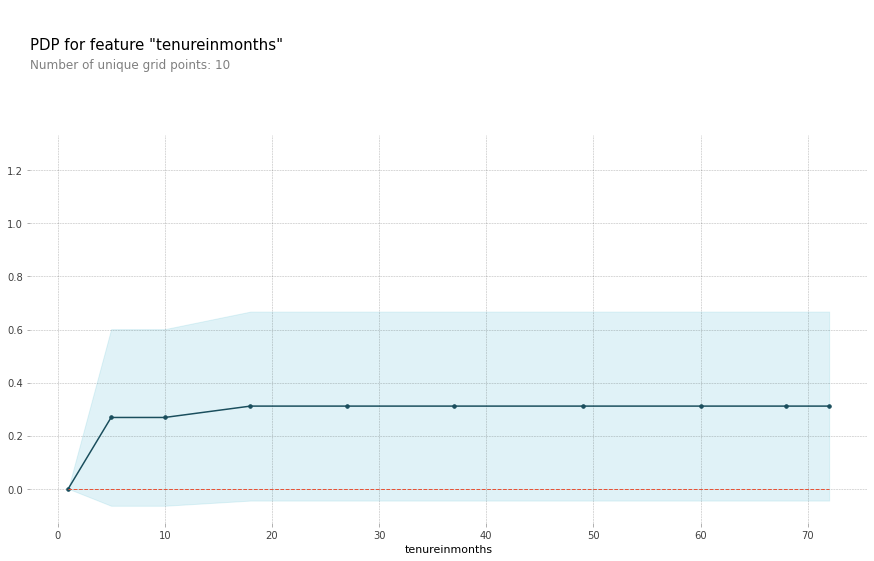

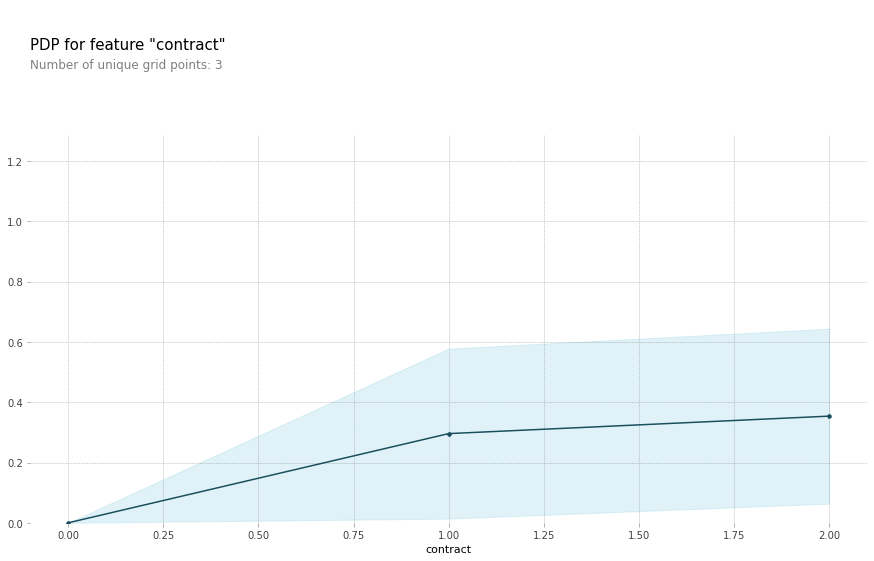

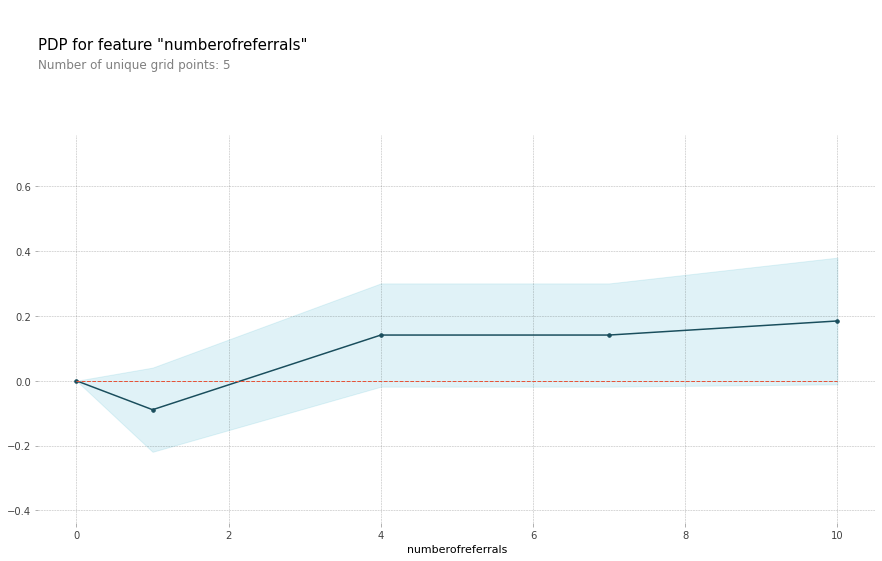

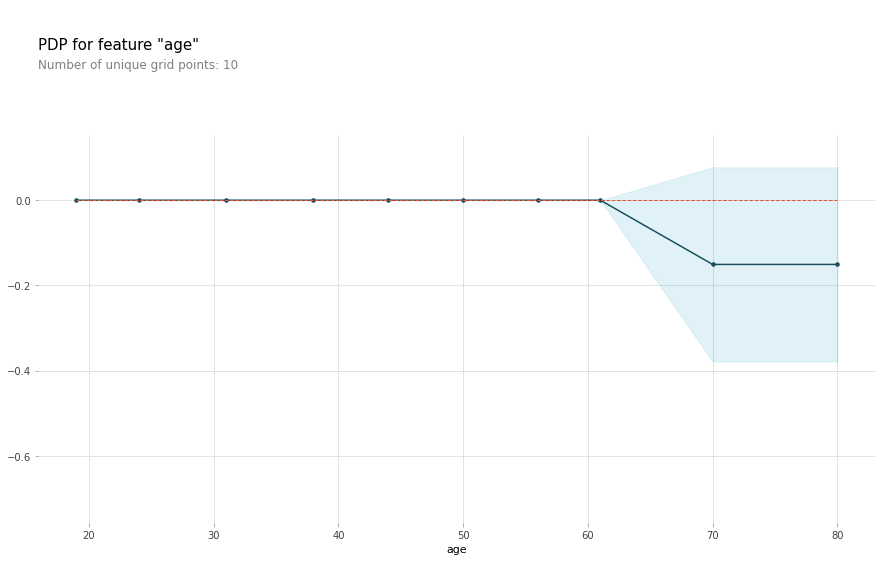

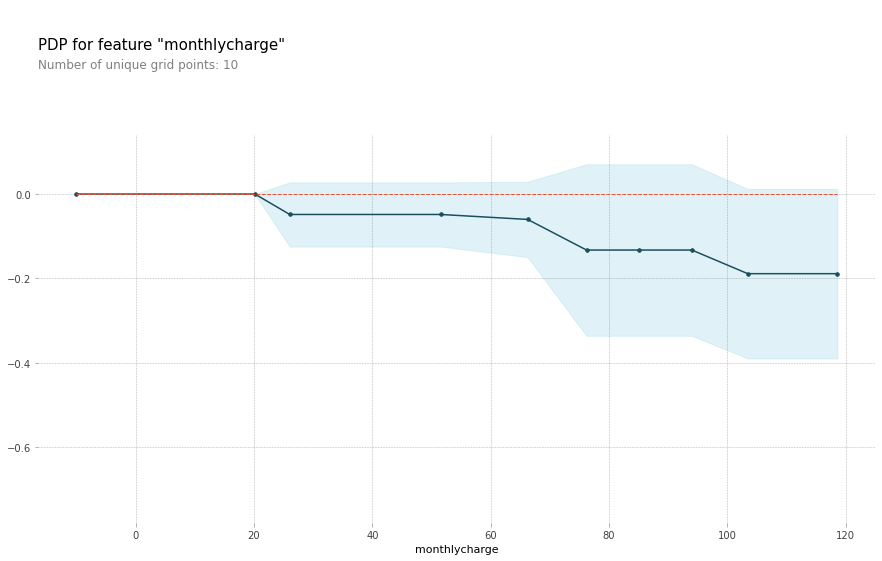

In [63]:
for feat_name in base_features_d:
    pdp_dist =  pdp.pdp_isolate(model=good_model_D1, dataset=val_X1_d,
                               model_features=base_features_d, feature=feat_name)
    pdp.pdp_plot(pdp_dist, feat_name)
    plt.show()

### Using SHAP Method for feature importance in Decision Tree

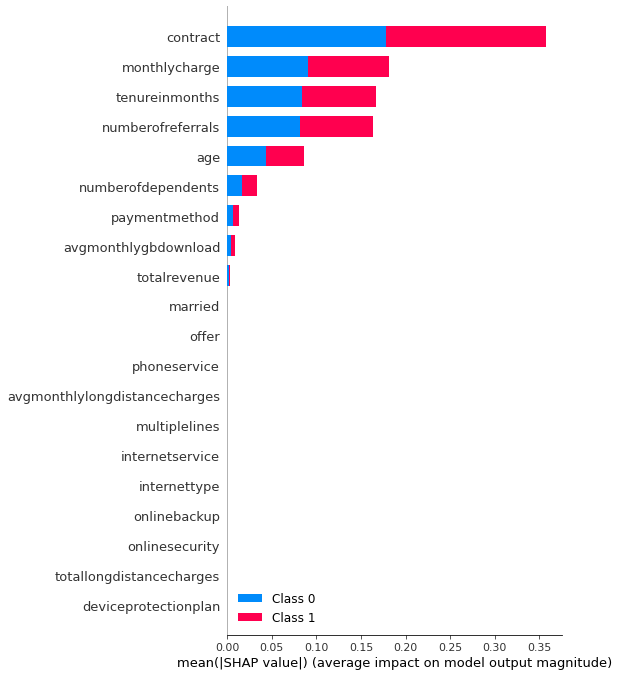

In [64]:
explainer = shap.TreeExplainer(good_model_D)
shap_values = explainer.shap_values(X)

shap.summary_plot(shap_values, X_train)

### Applying Permutation Importance on Random Forest

In [65]:
perm = PermutationImportance(good_model, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0932 ± 0.0146,contract
0.0518 ± 0.0084,tenureinmonths
0.0225 ± 0.0079,numberofreferrals
0.0192 ± 0.0080,monthlycharge
0.0144 ± 0.0094,age
0.0060 ± 0.0033,numberofdependents
0.0037 ± 0.0022,totalrevenue
0.0024 ± 0.0020,onlinesecurity
0.0009 ± 0.0041,married
0.0009 ± 0.0008,offer


In [66]:
from sklearn.ensemble import RandomForestRegressor
data1 = data.query('monthlycharge >= 0')
y1 = data.customerstatus
base_features=['tenureinmonths','contract','numberofreferrals','age','numberofdependents','monthlycharge']
X1 = data[base_features]
train_X1, val_X1, train_y1, val_y1 = train_test_split(X1, y1, random_state=1)
first_model = RandomForestRegressor(n_estimators=50, random_state=1).fit(train_X1, train_y1)
print("Data sample:")
data.head()
                  

Data sample:


,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,0,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


### Applying Partial distance Plots on Random Forest

In [67]:
from matplotlib.pyplot import figure
%matplotlib inline
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots

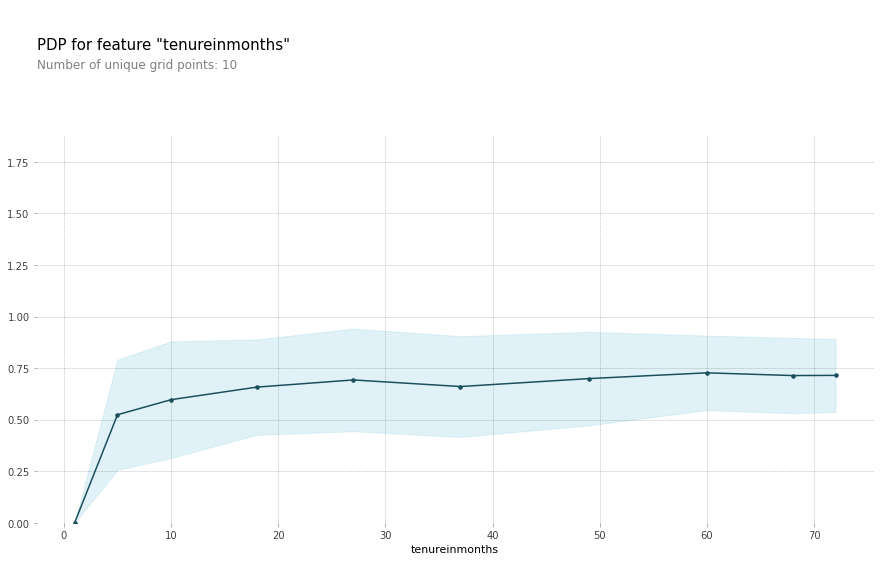

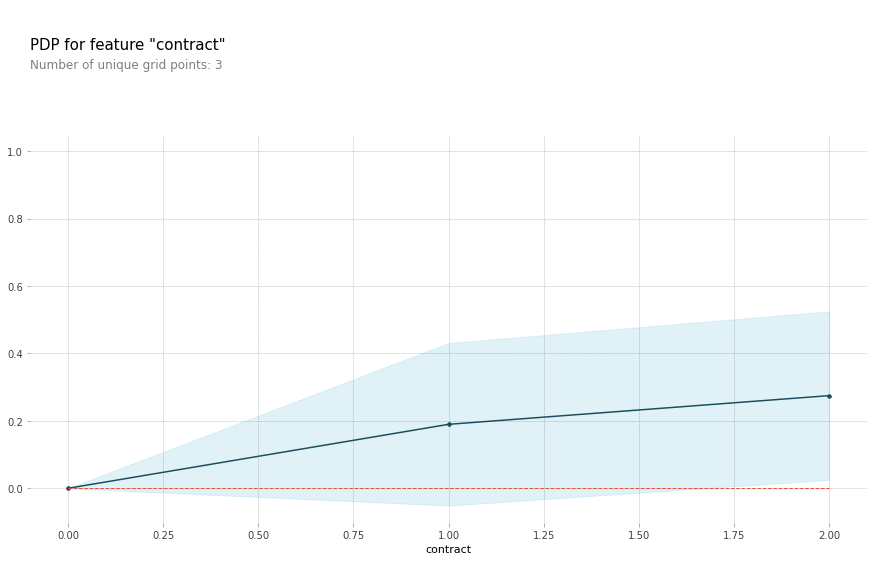

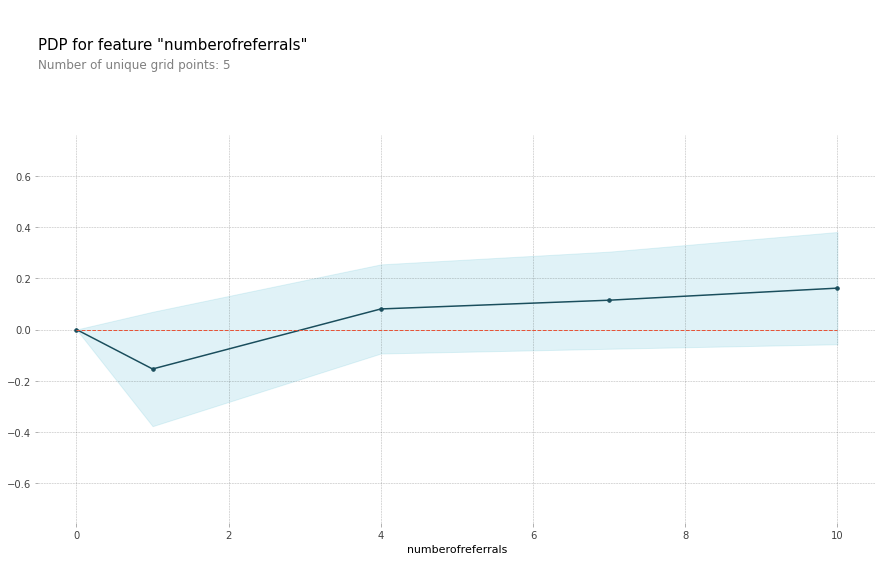

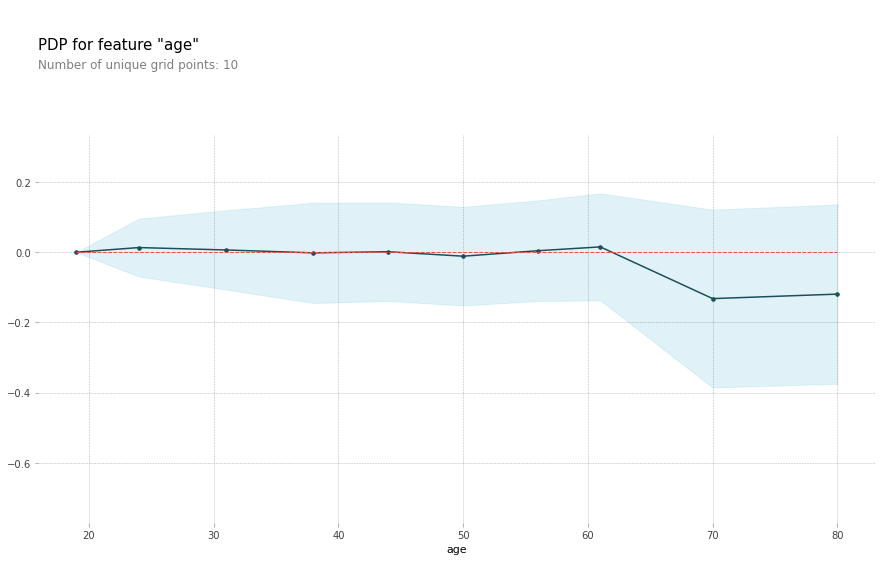

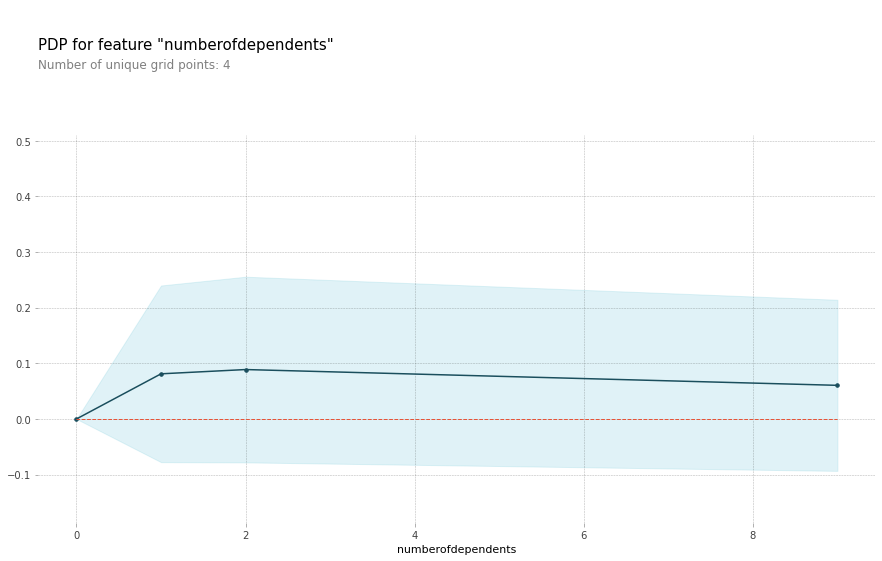

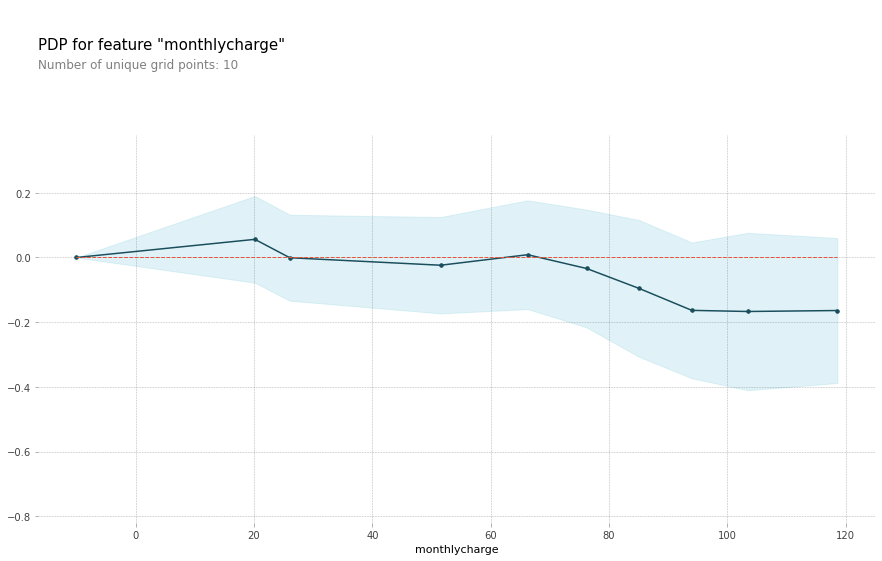

In [68]:
for feat_name in base_features:
    pdp_dist =  pdp.pdp_isolate(model=first_model, dataset=val_X1,
                               model_features=base_features, feature=feat_name)
    pdp.pdp_plot(pdp_dist, feat_name)
    plt.show()

In [69]:
good_model.predict(np.array(X_test.values[0]).reshape(1,-1))

array([1])

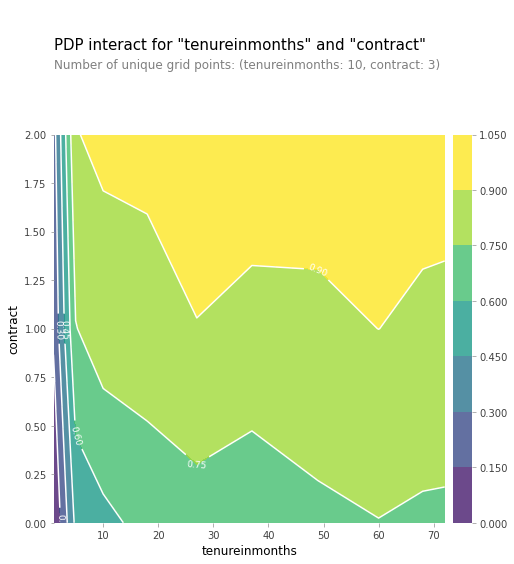

In [70]:
fnames = ['tenureinmonths', 'contract']
partial_plot  =  pdp.pdp_interact(model=first_model, dataset=val_X1,
                                  model_features=base_features, features=fnames)
pdp.pdp_interact_plot(pdp_interact_out=partial_plot,
                      feature_names=fnames, plot_type='contour')
plt.show()

## EVALUATING RANDOM FOREST ON THE BASIS OF IMPORTANT FEATURES

In [71]:
imp_features = ['contract', 'tenureinmonths']
# Specify non-default hyper-parameter values


RandomForestClassifier(max_features=15, max_leaf_nodes=16, n_estimators=50)
Results on test data
Test accuracy =  0.8609
Test precision =  0.8683
Test recall =  0.9499
Classification report:
              precision    recall  f1-score   support

           0       0.83      0.64      0.72       561
           1       0.87      0.95      0.91      1416

    accuracy                           0.86      1977
   macro avg       0.85      0.79      0.81      1977
weighted avg       0.86      0.86      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  357   204
1   71  1345

ROC curve


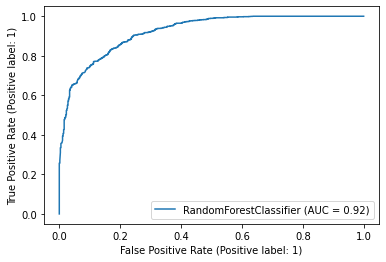

In [72]:
imp_features = ['contract', 'tenureinmonths']
# Specify non-default hyper-parameter values
max_features = 15
max_leaf_nodes = 16 
n_estimators = 50
# Train and test model
good_model = RandomForestClassifier(max_leaf_nodes = max_leaf_nodes,
                                    max_features = max_features, 
                                    n_estimators=n_estimators, ) # create model 
print(good_model) # display model parameters
good_model.fit(X_train, y_train) # train model
pred = good_model.predict(X_test) # predicted output for test examples
print("Results on test data")
acc = accuracy_score(y_test, pred) # accuracy on test examples
prec = precision_score(y_test, pred) # precision on test examples
reca = recall_score(y_test, pred) # recall on test examples
print(f'Test accuracy = {acc: .4f}') # round to 4 decimal places
print(f'Test precision = {prec: .4f}') # round to 4 decimal places
print(f'Test recall = {reca: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, pred))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, pred)))
print('\nROC curve')
plot_roc_curve(good_model, X_test, y_test)  # 
plt.show()

In [73]:
perm = PermutationImportance(good_modelL, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1866 ± 0.0131,tenureinmonths
0.0706 ± 0.0179,contract
0.0635 ± 0.0090,numberofreferrals
0.0372 ± 0.0116,married
0.0357 ± 0.0082,totalcharges
0.0339 ± 0.0060,internetservice
0.0312 ± 0.0138,totalrevenue
0.0208 ± 0.0075,numberofdependents
0.0143 ± 0.0127,onlinesecurity
0.0121 ± 0.0023,premiumtechsupport


In [74]:
y2 = data.customerstatus
base_features2=['tenureinmonths','contract','numberofreferrals','married','totalcharges']
X2 = data[base_features]
train_X2, val_X2, train_y2, val_y2 = train_test_split(X2, y, random_state=1)
second_model= LogisticRegression(C=1000, max_iter= 1000).fit(train_X2, train_y2)
print("Data sample:")
data.head()

Data sample:


,gender,age,married,numberofdependents,numberofreferrals,tenureinmonths,offer,phoneservice,avgmonthlylongdistancecharges,multiplelines,...,unlimiteddata,contract,paperlessbilling,paymentmethod,monthlycharge,totalcharges,totalextradatacharges,totallongdistancecharges,totalrevenue,customerstatus
0,1,37,1,0,2,9,0,1,42.39,0,...,1,1,1,1,65.6,593.30,0,381.51,974.81,1
1,0,46,0,0,0,9,0,1,10.69,1,...,0,0,0,1,-4.0,542.40,10,96.21,610.28,1
2,0,50,0,0,0,4,5,1,33.65,0,...,1,0,1,0,73.9,280.85,0,134.60,415.45,0
3,0,78,1,0,1,13,4,1,27.82,0,...,1,0,1,0,98.0,1237.85,0,361.66,1599.51,0
4,1,75,1,0,3,3,0,1,7.38,0,...,1,0,1,1,83.9,267.40,0,22.14,289.54,0


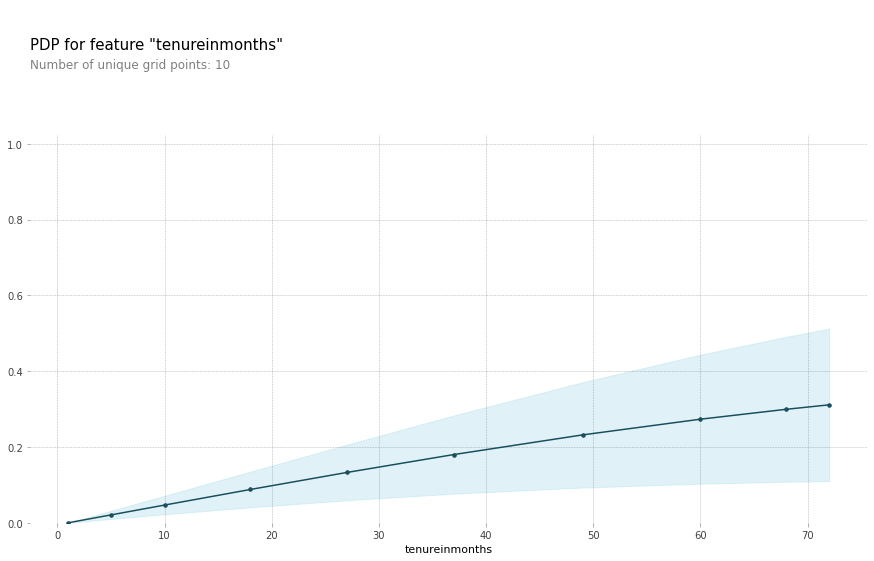

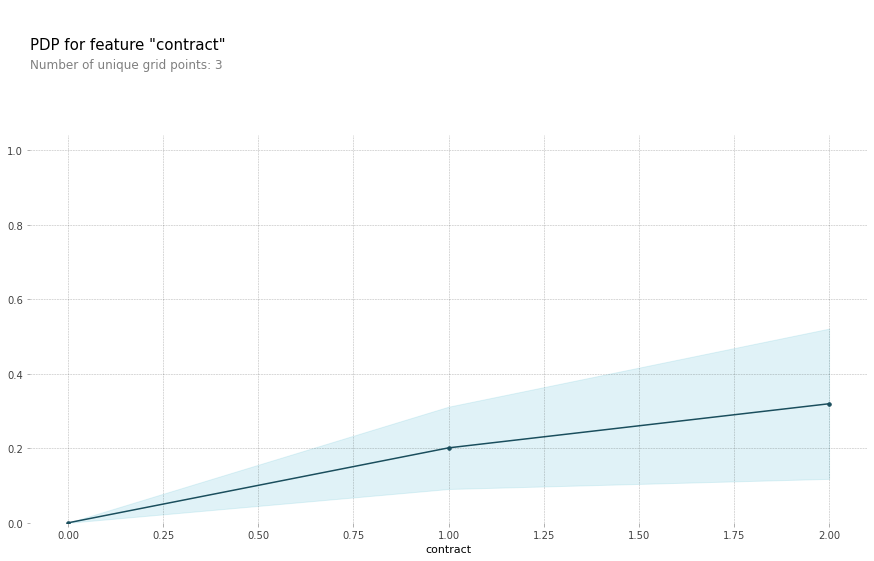

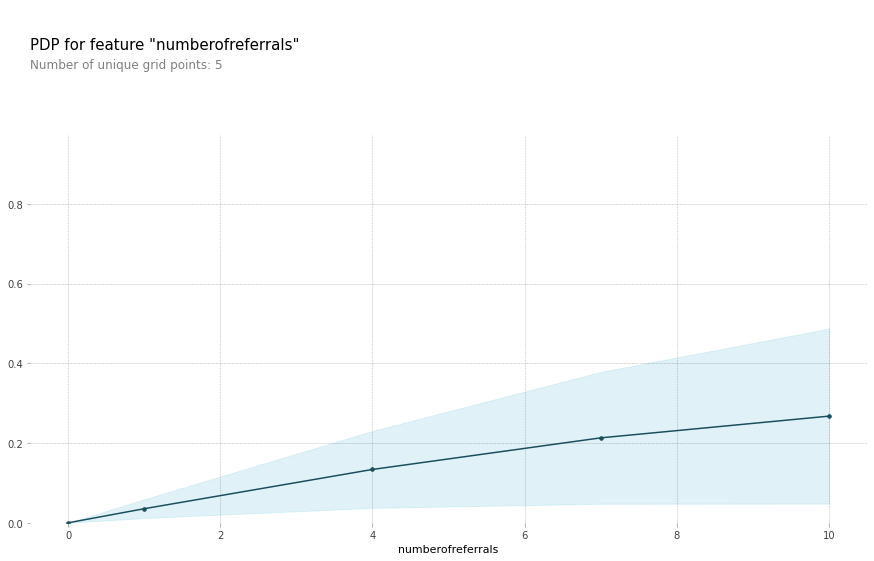

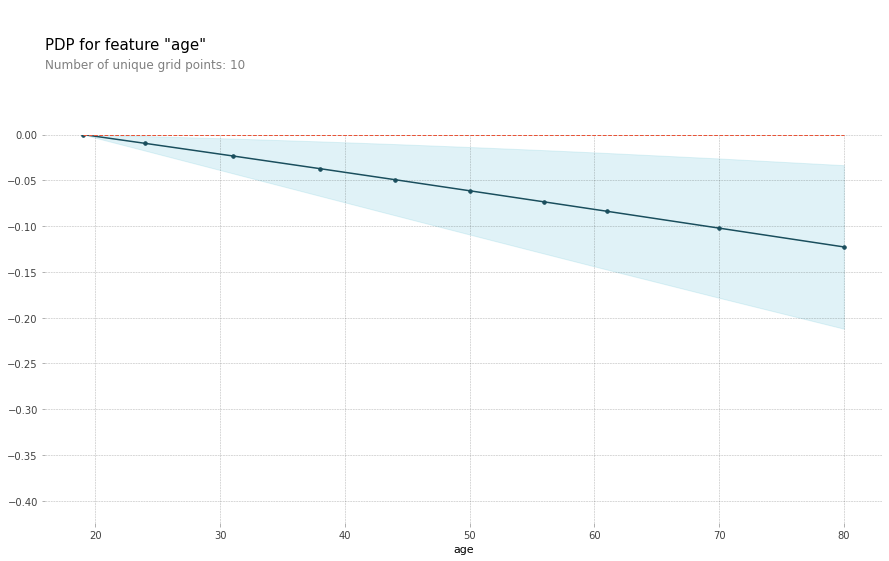

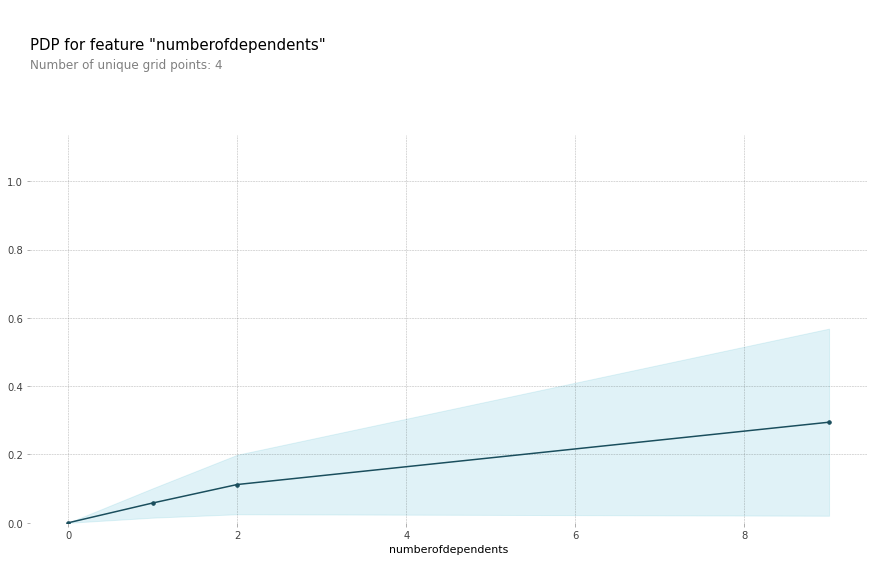

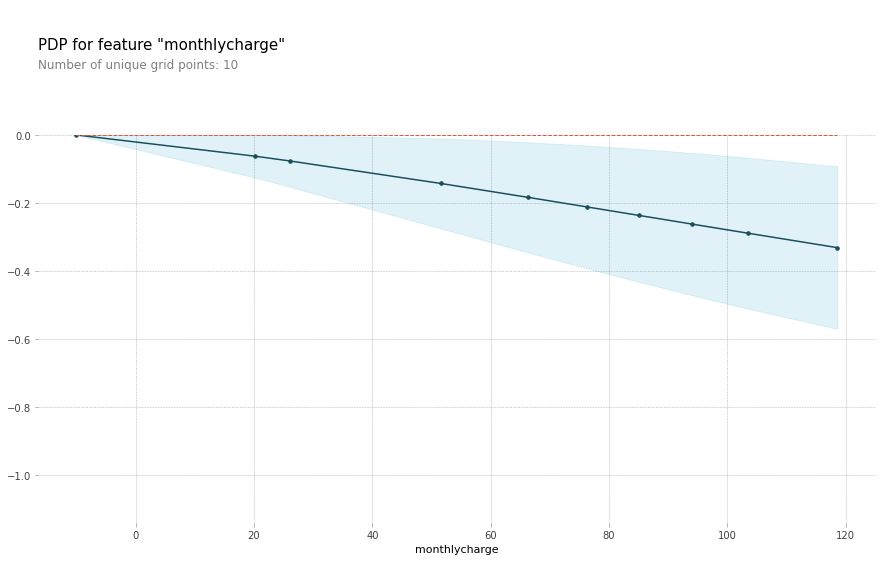

In [75]:
for feat_name in base_features:
    pdp_dist =  pdp.pdp_isolate(model=second_model, dataset=val_X2,
                               model_features=base_features, feature=feat_name)
    pdp.pdp_plot(pdp_dist, feat_name)
    plt.show()

### **Evaluating The Logistic Regression Model on the basis of best found hyperparameters and the most important Features** 

Results on test data
Test accuracy =  0.8543
Test precision =  0.8989
Test recall =  0.8976
Classification report:
              precision    recall  f1-score   support

           0       0.74      0.75      0.74       561
           1       0.90      0.90      0.90      1416

    accuracy                           0.85      1977
   macro avg       0.82      0.82      0.82      1977
weighted avg       0.85      0.85      0.85      1977

Confusion matrix (Rows actual, Columns predicted):
     0     1
0  418   143
1  145  1271

ROC curve


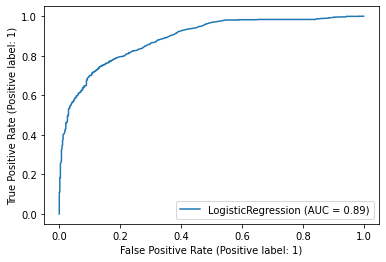

In [76]:
imp_features = ['contract', 'tenureinmonths', 'numberofreferrals','married']
model_impL = LogisticRegression(C=1000, max_iter= 1000) # model with important features
model_impL.fit(X_train[imp_features], y_train)
pred = model_impL.predict(X_train[imp_features]) # predicted output for test examples
print("Results on test data")
accL = accuracy_score(y_test, predL) # accuracy on test examples
precL = precision_score(y_test, predL) # precision on test examples
recaL = recall_score(y_test, predL) # recall on test examples
print(f'Test accuracy = {accL: .4f}') # round to 4 decimal places
print(f'Test precision = {precL: .4f}') # round to 4 decimal places
print(f'Test recall = {recaL: .4f}') # round to 4 decimal places
print("Classification report:")
print(classification_report(y_test, predL))
print("Confusion matrix (Rows actual, Columns predicted):")
print(pd.DataFrame(confusion_matrix(y_test, predL)))
print('\nROC curve')
plot_roc_curve(model_impL, X_test[imp_features], y_test)  
plt.show()

## PERMUTAION IMPORTANCE ON KNN

In [77]:
perm = PermutationImportance(good_modelknn, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.0340 ± 0.0083,numberofreferrals
0.0250 ± 0.0090,avgmonthlygbdownload
0.0191 ± 0.0112,age
0.0101 ± 0.0066,tenureinmonths
0.0094 ± 0.0067,contract
0.0058 ± 0.0040,internettype
0.0044 ± 0.0053,totalrevenue
0.0040 ± 0.0052,onlinesecurity
0.0033 ± 0.0032,gender
0.0028 ± 0.0026,numberofdependents


## PERMUTATION IMPORTANCE ON SVM

In [78]:
perm = PermutationImportance(good_modelsvm, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1992 ± 0.0131,tenureinmonths
0.0655 ± 0.0172,contract
0.0589 ± 0.0094,numberofreferrals
0.0399 ± 0.0042,totalcharges
0.0347 ± 0.0117,totalrevenue
0.0305 ± 0.0103,married
0.0226 ± 0.0061,internetservice
0.0196 ± 0.0074,numberofdependents
0.0133 ± 0.0088,onlinesecurity
0.0091 ± 0.0039,premiumtechsupport


# Conclusion
SIX MACHINE LEARNING MODELS WERE BUILT AND TRAINED

### RANDOM FOREST OUTPERFORMED OTHER MODELS

### MOST IMPORTANT FEATURES ARE
		CONTRACT
		MONTHLY CHARGE
		TENURE IN MONTHS
		NUMBER OF REFERRALS
		NUMBER OF INDEPENDENTS

## Further Working can be done in model explanation using LIME and SHAP methods that build more trust and reliability on the above used models